Task 1: Understand the problem statement and business case

Task 2: Import libraries/datasets

In [89]:
#import necessary packages

import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow import keras
import os
import matplotlib.pyplot as plt
import PIL
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model

from IPython.display import display
from tensorflow.keras.utils import plot_model
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler

In [90]:
from jupyterthemes import jtplot
jtplot.style(theme='monokai', context='notebook', ticks=True, grid=False) 
# setting the style of the notebook to be monokai theme  
# this line of code is important to ensure that we are able to see the x and y axes clearly
# If you don't run this code line, you will notice that the xlabel and ylabel on any plot is black on black and it will be hard to see them. 

In [91]:
diabetic_categories = os.listdir('./train')

In [92]:
diabetic_categories

['Mild', 'Moderate', 'No_DR', 'Proliferate_DR', 'Severe']

In [93]:
os.listdir(
    os.path.join('train','Moderate')
)

['000c1434d8d7.png',
 '00a8624548a9.png',
 '00b74780d31d.png',
 '00e4ddff966a.png',
 '012a242ac6ff.png',
 '0161338f53cc.png',
 '0180bfa26c0b.png',
 '01c7808d901d.png',
 '01eb826f6467.png',
 '025a169a0bb0.png',
 '026dcd9af143.png',
 '032d7b0b4bf6.png',
 '033f2b43de6d.png',
 '03676c71ed1b.png',
 '03747397839f.png',
 '03fd50da928d.png',
 '03ff7d159f10.png',
 '0415fc68b176.png',
 '041f09eec1e8.png',
 '04a6fc58dabc.png',
 '04d029cfb612.png',
 '0519b934f6b1.png',
 '052d9a3fe55a.png',
 '06024377d573.png',
 '064af6592ba6.png',
 '07083738b75e.png',
 '071435a218ec.png',
 '07419eddd6be.png',
 '07a3be30563b.png',
 '07d8db76b301.png',
 '08752092140d.png',
 '08c17a2d95b7.png',
 '094858f005ab.png',
 '0953c0ac1735.png',
 '09eeafa9656a.png',
 '09f6ab477654.png',
 '0a09aa7356c0.png',
 '0a1076183736.png',
 '0a9ec1e99ce4.png',
 '0ac436400db4.png',
 '0af296d2f04a.png',
 '0afdfe5f422c.png',
 '0c2e2369dfff.png',
 '0c55d58bebaf.png',
 '0c76fd494af6.png',
 '0c7e82daf5a0.png',
 '0ca0aee4d57e.png',
 '0d0a21fd354

In [94]:
#Check the number of images in the dataset
train = []
label = []

#os.listdir returns the list of files in the folder, in this case image class names

for i in os.listdir('./train'):
    train_class = os.listdir(os.path.join('train', i))

    for j in train_class:
        img = os.path.join('train', i, j)

        train.append(img)
        label.append(i)

print('Number of train images = {}'.format(len(train)))
                             

Number of train images = 3662


In [95]:
train

['train\\Mild\\0024cdab0c1e.png',
 'train\\Mild\\00cb6555d108.png',
 'train\\Mild\\0124dffecf29.png',
 'train\\Mild\\01b3aed3ed4c.png',
 'train\\Mild\\0369f3efe69b.png',
 'train\\Mild\\03e25101e8e8.png',
 'train\\Mild\\04ac765f91a1.png',
 'train\\Mild\\059bc89df7f4.png',
 'train\\Mild\\05a5183c92d0.png',
 'train\\Mild\\0684311afdfc.png',
 'train\\Mild\\06b71823f9cd.png',
 'train\\Mild\\07929d32b5b3.png',
 'train\\Mild\\07a1c7073982.png',
 'train\\Mild\\086d41d17da8.png',
 'train\\Mild\\09935d72892b.png',
 'train\\Mild\\0a3202889f4d.png',
 'train\\Mild\\0a61bddab956.png',
 'train\\Mild\\0ad7f631dedb.png',
 'train\\Mild\\0d310aba6373.png',
 'train\\Mild\\0dc031c94225.png',
 'train\\Mild\\0dce95217626.png',
 'train\\Mild\\0eb52045349f.png',
 'train\\Mild\\0f495d87656a.png',
 'train\\Mild\\0fb1053285cf.png',
 'train\\Mild\\101b9ebfc720.png',
 'train\\Mild\\107aea0d9289.png',
 'train\\Mild\\10f36b0239fb.png',
 'train\\Mild\\1116271db4ea.png',
 'train\\Mild\\111898ab463d.png',
 'train\\Mild\

In [96]:
label

['Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 

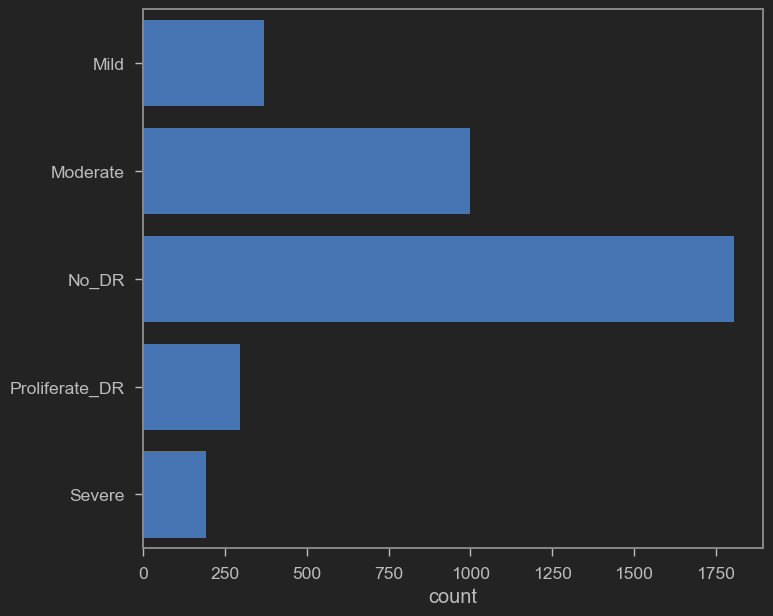

In [97]:
sns.countplot(label)
plt.show()

Task 3:Perform Image visualization

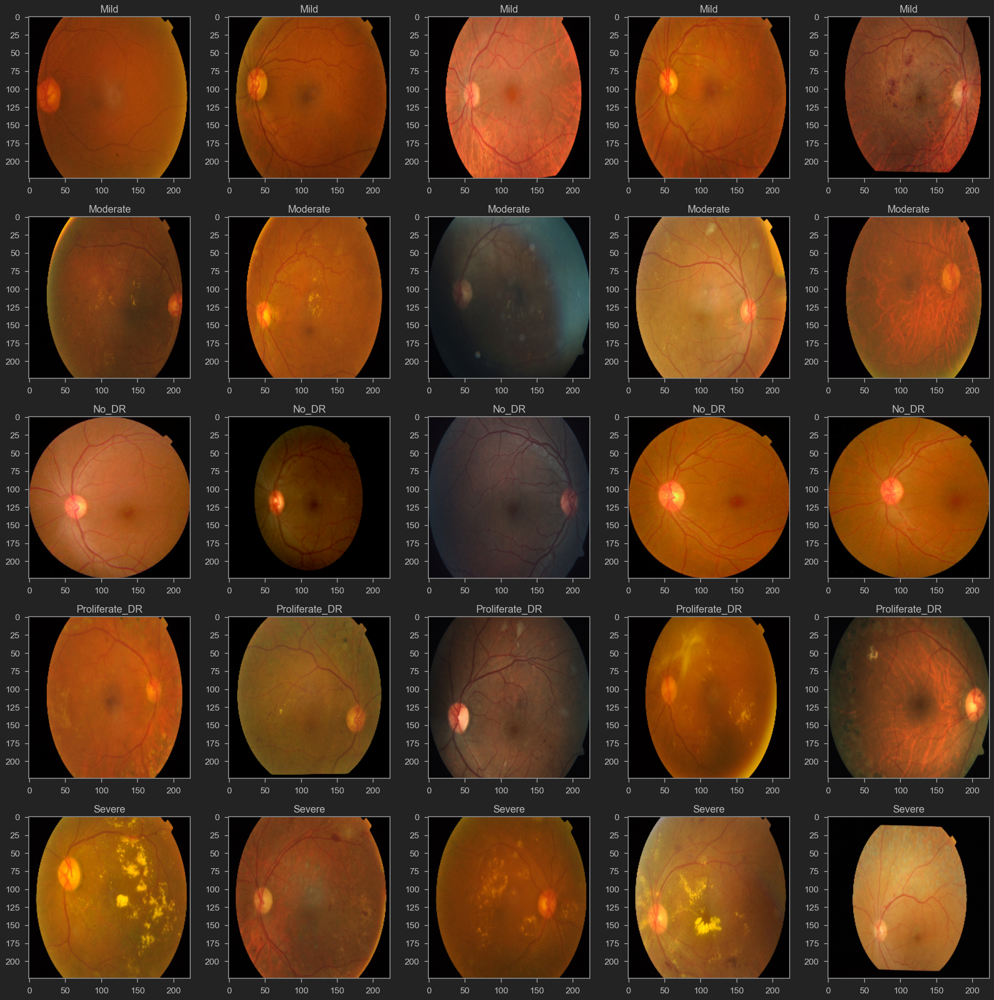

In [98]:
#Visualize 5 images for each class in the dataset

fig, axs = plt.subplots(5, 5, figsize=(20,20))
count = 0

for i in os.listdir('./train'):
    #get the list of images in the given class

    train_class = os.listdir(os.path.join('train', i))
    #plot 5 images per class

    for j in range(5):
        img = os.path.join('train', i, train_class[j])
        img = PIL.Image.open(img)
        axs[count][j].title.set_text(i)
        axs[count][j].imshow(img)
    count += 1

fig.tight_layout()

In [99]:




#check the number of images in each class in the training dataset

No_images_per_class = []
Class_name = []

for i in os.listdir('./train'):
    train_class = os.listdir(os.path.join('train',i))
    No_images_per_class.append(len(train_class))
    Class_name.append(i)
    print('Number of images in {} - {}\n'.format(i, len(train_class)))

Number of images in Mild - 370

Number of images in Moderate - 999

Number of images in No_DR - 1805

Number of images in Proliferate_DR - 295

Number of images in Severe - 193



In [100]:
retina_df = pd.DataFrame(
    {'Image':train, 'Labels':label}
)
retina_df

,Image,Labels
0,train\Mild\0024cdab0c1e.png,Mild
1,train\Mild\00cb6555d108.png,Mild
2,train\Mild\0124dffecf29.png,Mild
3,train\Mild\01b3aed3ed4c.png,Mild
4,train\Mild\0369f3efe69b.png,Mild
...,...,...
3657,train\Severe\f9156aeffc5e.png,Severe
3658,train\Severe\fb61230b99dd.png,Severe
3659,train\Severe\fcc6aa6755e6.png,Severe
3660,train\Severe\fda39982a810.png,Severe


In [101]:
retina_df.head()

,Image,Labels
0,train\Mild\0024cdab0c1e.png,Mild
1,train\Mild\00cb6555d108.png,Mild
2,train\Mild\0124dffecf29.png,Mild
3,train\Mild\01b3aed3ed4c.png,Mild
4,train\Mild\0369f3efe69b.png,Mild


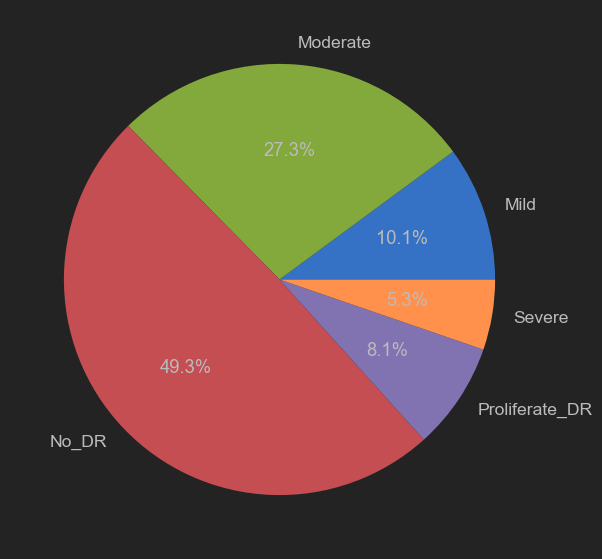

In [102]:
fig1, ax1 = plt.subplots()

ax1.pie(No_images_per_class, labels = Class_name, autopct = '%1.1f%%')
plt.show()

Task 4:Perform image Augmentation

In [103]:
#shuffle the training data and split it into training and testing

retina_df = shuffle(retina_df)
train, test = train_test_split(retina_df, test_size = 0.2)

In [104]:
#Create run-time augmentation on training and test dataset
#For training datagenerator, we add normalization, shear angle, zooming range and horizontal flip

train_datagen = ImageDataGenerator(
    rescale = 1./255,
    shear_range = 0.2,
    vertical_flip = True,
    validation_split = 0.15)

#For test datagenerator, we only normalize the data
test_datagen = ImageDataGenerator(rescale = 1./255)

In [105]:
#Creating data generator for training, validation and test dataset

train_generator = train_datagen.flow_from_dataframe(
    train,
    directory = './',
    x_col = 'Image',
    y_col = 'Labels',
    target_size = (256,256),
    color_mode = 'rgb',
    class_mode = 'categorical',
    batch_size = 32,
    subset = 'training')

validation_generator = train_datagen.flow_from_dataframe(
    train,
    directory = './',
    x_col = 'Image',
    y_col = 'Labels',
    target_size = (256,256),
    color_mode = 'rgb',
    class_mode = 'categorical',
    batch_size = 32,
    subset = 'validation')

test_generator = train_datagen.flow_from_dataframe(
    test,
    directory = './',
    x_col = 'Image',
    y_col = 'Labels',
    target_size = (256,256),
    color_mode = 'rgb',
    class_mode = 'categorical',
    batch_size = 32)

Found 2490 validated image filenames belonging to 5 classes.
Found 439 validated image filenames belonging to 5 classes.
Found 733 validated image filenames belonging to 5 classes.


Task 5: Understand the theory and intuition behind ResNets

In [106]:
def res_block(X, filter, stage):

    #Convolution_block
    X_copy = X

    f1, f2, f3 = filter

    #Main Path
    X = Conv2D(f1, (1,1), strides = (1,1), name = 'res_' + str(stage) + '_conv_a', kernel_initializer = glorot_uniform(seed = 0))(X)
    X = MaxPool2D((2,2))(X)
    X = BatchNormalization(axis=3, name = 'bn_' + str(stage) +  '_conv_a')(X)
    X = Activation('relu')(X)

    X = Conv2D(f2, kernel_size = (3,3), strides = (1,1), padding = 'same', name = 'res_' + str(stage) + '_conv_b', kernel_initializer = glorot_uniform(seed = 0))(X)
    X = BatchNormalization(axis = 3, name = 'bn_' + str(stage) +  '_conv_b')(X)
    X = Activation('relu')(X)

    X = Conv2D(f3, kernel_size = (1,1), strides = (1,1), name = 'res_' + str(stage) + '_conv_c', kernel_initializer = glorot_uniform(seed = 0))(X)
    X = BatchNormalization(axis = 3, name = 'bn_' + str(stage) +  '_conv_c')(X)

    #Short_Path
    X_copy = Conv2D(f3, kernel_size = (1,1), strides = (1,1), name = 'res_' + str(stage) + '_conv_copy', kernel_initializer = glorot_uniform(seed = 0))(X_copy)
    X_copy = MaxPool2D((2,2))(X_copy)
    X = BatchNormalization(axis = 3, name = 'bn_' + str(stage) +  '_conv_copy')(X_copy)

    #Add
    X = Add()([X,X_copy])
    X = Activation('relu')(X)

    #Identity block 1
    X_copy = X

    #Main path
    X = Conv2D(f1, (1,1), strides = (1,1), name = 'res_' + str(stage) + '_identity_1_a', kernel_initializer = glorot_uniform(seed = 0))(X)
    X = BatchNormalization(axis = 3, name = 'bn_' + str(stage) +  '_identity_1_a')(X)
    X = Activation('relu')(X)

    X = Conv2D(f2, kernel_size = (3,3), strides = (1,1), padding = 'same', name = '_identity_1_b' + str(stage) + '_conv_b', kernel_initializer = glorot_uniform(seed = 0))(X)
    X = BatchNormalization(axis = 3, name = 'bn_' + str(stage) +  '_identity_1_b')(X)
    X = Activation('relu')(X)

    X = Conv2D(f3, kernel_size = (1,1), strides = (1,1), name = 'res_' + str(stage) + '_identity_1_c', kernel_initializer = glorot_uniform(seed = 0))(X)
    X = BatchNormalization(axis = 3, name = 'bn_' + str(stage) +  '_identity_1_c')(X)

    #Add
    X = Add()([X,X_copy])
    X = Activation('relu')(X)

    #Identity block 2
    X_copy = X

    #Main Path
    X = Conv2D(f1, (1,1), strides = (1,1), name = 'res_' + str(stage) + '_identity_2_a', kernel_initializer = glorot_uniform(seed = 0))(X)
    X = BatchNormalization(axis = 3, name = 'bn_' + str(stage) +  '_identity_2_a')(X)
    X = Activation('relu')(X)

    X = Conv2D(f2, kernel_size = (3,3), strides = (1,1), padding = 'same', name = 'res_' + str(stage) + '_identity_2_b', kernel_initializer = glorot_uniform(seed = 0))(X)
    X = BatchNormalization(axis = 3, name = 'bn_' + str(stage) +  '_identity_2_b')(X)
    X = Activation('relu')(X)

    X = Conv2D(f3, kernel_size = (1,1), strides = (1,1), name = 'res_' + str(stage) + '_identity_2_c', kernel_initializer = glorot_uniform(seed = 0))(X)
    X = BatchNormalization(axis = 3, name = 'bn_' + str(stage) +  '_identity_2_c')(X)

    #Add
    X = Add()([X,X_copy])
    X = Activation('relu')(X)

    return X

Task 6: Build Deep Residual Neural Networks

In [107]:
input_shape = (256, 256, 3)

#Input tensor shape
X_input = Input(input_shape)

#Zero padding
X = ZeroPadding2D((3,3))(X_input)

# 1 - Stage
X = Conv2D(64, (7,7), strides=(2,2), name = 'conv1', kernel_initializer=glorot_uniform(seed=0))(X)
X = BatchNormalization(axis=3, name='bn_conv1')(X)
X = Activation('relu')(X)
X = MaxPooling2D((3,3), strides=(2,2))(X)

# 2 - Stage
X = res_block(X, filter=[64,64,256], stage=2)

# 3 - Stage
X = res_block(X, filter=[128,128,512], stage=3)

# 4 - Stage
X = res_block(X, filter=[256,256,1024], stage=4)

# 5 - Stage
#X = res_block(X, filter=[512,512,2048], stage=5)

#Average Pooling
X = AveragePooling2D((2,2), name = 'Average_Pooling')(X)

#Final layer
X = Flatten()(X)
X = Dense(5, activation = 'softmax', name = 'Dense_final', kernel_initializer = glorot_uniform(seed=0))(X)

model = Model( inputs = X_input, outputs = X, name = 'Resnet18')

model.summary()


Model: "Resnet18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)    │ (None, 256, 256, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ zero_padding2d_1              │ (None, 262, 262, 3)       │               0 │ input_layer_1[0][0]        │
│ (ZeroPadding2D)               │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1 (Conv2D)                │ (None, 128, 128, 64)      │           9,472 │ zero_padding2d_1[0][0]     │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ bn_conv1 (BatchNormalization) │ (None, 128, 128, 64)      │             256 │ conv1[0][0]                │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ activation_28 (Activation)    │ (None, 128, 128, 64)      │               0 │ bn_conv1[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ max_pooling2d_7               │ (None, 63, 63, 64)        │               0 │ activation_28[0][0]        │
│ (MaxPooling2D)                │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ res_2_conv_copy (Conv2D)      │ (None, 63, 63, 256)       │          16,640 │ max_pooling2d_7[0][0]      │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ max_pooling2d_9               │ (None, 31, 31, 256)       │               0 │ res_2_conv_copy[0][0]      │
│ (MaxPooling2D)                │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ bn_2_conv_copy                │ (None, 31, 31, 256)       │           1,024 │ max_pooling2d_9[0][0]      │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ add_9 (Add)                   │ (None, 31, 31, 256)       │               0 │ bn_2_conv_copy[0][0],      │
│                               │                           │                 │ max_pooling2d_9[0][0]      │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ activation_31 (Activation)    │ (None, 31, 31, 256)       │               0 │ add_9[0][0]                │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ res_2_identity_1_a (Conv2D)   │ (None, 31, 31, 64)        │          16,448 │ activation_31[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ bn_2_identity_1_a             │ (None, 31, 31, 64)        │             256 │ res_2_identity_1_a[0][0]   │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ activation_32 (Activation)    │ (None, 31, 31, 64)        │               0 │ bn_2_identity_1_a[0][0]    │
├───────────────────────────────┼───────────────────────────┼───────────────

 Total params: 3,687,941 (14.07 MB)

 Trainable params: 3,673,477 (14.01 MB)

 Non-trainable params: 14,464 (56.50 KB)

Task 7: Compile and train deep learning model

In [108]:
model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

In [109]:
#using early stopping to exit and training if validation loss is not decreasing even after certain epochs (patience)
early_stopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)

#save the best model with lower validation loss
checkpointer = ModelCheckpoint(filepath ="weights.keras", verbose=1, save_best_only=True)

In [110]:
history = model.fit(train_generator, steps_per_epoch=  train_generator.n//32, epochs = 20, validation_data = validation_generator, validation_steps = validation_generator.n//32, callbacks = [checkpointer, early_stopping]) 

Epoch 1/20


C:\Users\shihamf\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5573 - loss: 4.4502
Epoch 1: val_loss improved from inf to 1.54498, saving model to weights.keras
77/77 ━━━━━━━━━━━━━━━━━━━━ 185s 2s/step - accuracy: 0.5583 - loss: 4.4204 - val_accuracy: 0.0817 - val_loss: 1.5450
Epoch 2/20
 1/77 ━━━━━━━━━━━━━━━━━━━━ 1:57 2s/step - accuracy: 0.7188 - loss: 0.6742

C:\Users\shihamf\AppData\Local\Programs\Python\Python311\Lib\contextlib.py:155: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)



Epoch 2: val_loss did not improve from 1.54498
77/77 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.7188 - loss: 0.6742 - val_accuracy: 0.0435 - val_loss: 1.6432
Epoch 3/20
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6988 - loss: 0.8046
Epoch 3: val_loss improved from 1.54498 to 1.46826, saving model to weights.keras
77/77 ━━━━━━━━━━━━━━━━━━━━ 137s 2s/step - accuracy: 0.6988 - loss: 0.8053 - val_accuracy: 0.2909 - val_loss: 1.4683
Epoch 4/20
 1/77 ━━━━━━━━━━━━━━━━━━━━ 2:01 2s/step - accuracy: 0.6250 - loss: 1.0995
Epoch 4: val_loss did not improve from 1.46826
77/77 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.6250 - loss: 1.0995 - val_accuracy: 0.2174 - val_loss: 1.5973
Epoch 5/20
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7287 - loss: 0.7547
Epoch 5: val_loss did not improve from 1.46826
77/77 ━━━━━━━━━━━━━━━━━━━━ 162s 2s/step - accuracy: 0.7287 - loss: 0.7548 - val_accuracy: 0.2837 - val_loss: 1.5248
Epoch 6/20
 1/77 ━━━━━━━━━━━━━━━━━━━━ 3:04 2s/step - accuracy: 

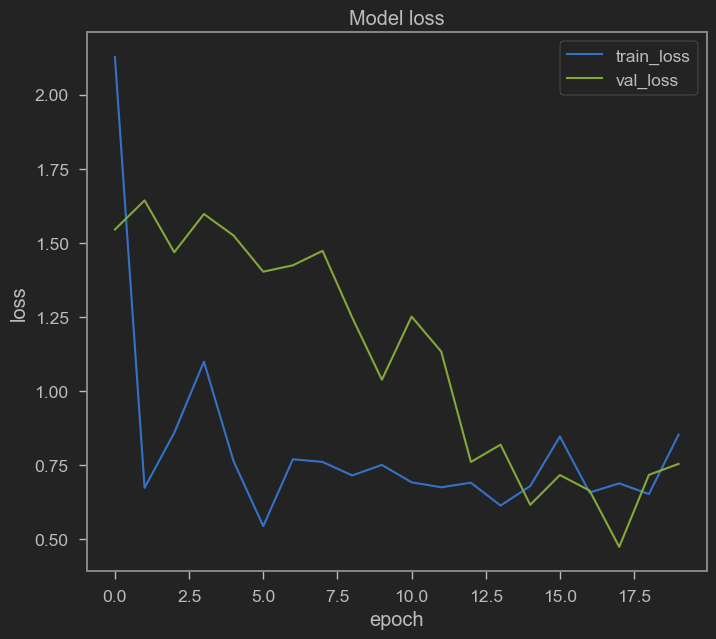

In [111]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train_loss', 'val_loss'], loc = 'upper right')
plt.show()

Task 8: Assess/evaluate trained model performance

In [112]:
model.load_weights("weights.keras")

In [113]:
#Evaluate the performance of the model
evaluate = model.evaluate(test_generator, steps = test_generator.n // 32, verbose = 1)

print('Accuracy Test : {}'.format(evaluate[1]))

22/22 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step - accuracy: 0.7451 - loss: 0.7307
Accuracy Test : 0.7457386255264282


In [114]:
#Assigning labels names to the corresponding index
labels = {
    0: 'Mild',
    1: 'Moderate',
    2: 'No_DR',
    3: 'Proliferate_DR',
    4: 'Severe'
}

In [118]:
#loading images and their predictioins

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

prediction = []
original = []
image = []
count = 0

for item in range(len(test)):

    #code to open the image
    img = PIL.Image.open(test['Image'].tolist()[item])

    #resizing the image to (256,256)
    img = img.resize((256,256))

    #converting img to array
    img = np.asarray(img, dtype = np.float32)

    #normalizing the image
    img = img / 255

    #reshaping the image into a 4D array
    img = img.reshape(-1,256,256,3)

    #making prediction of the model
    predict = model.predict(img)

    #getting the index corresponding to the highest value in the prediction
    predict = np.argmax(predict)

    #appending the predcited class to the list
    prediction.append(labels[predict])

    #appending original class to the list
    original.append(test['Labels'].tolist()[item])

    image.append(test['Image'].tolist()[item])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━

In [116]:
#Getting the test accuracy
score = accuracy_score(original,prediction)
print("Test Accuracy : {}".format(score))

Test Accuracy : 0.7312414733969986


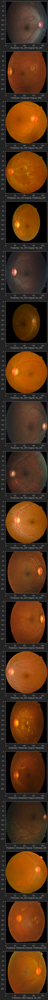

In [133]:
import random
fig = plt.figure(figsize=(100,100))

for i in range(20):
    j = random.randint(0, len(image) - 1)
    
    # Open the image file and convert to array for plotting
    img = PIL.Image.open(image[j])  # Load image from file path
    img = np.asarray(img, dtype=np.float32)  # Convert to array
    
    fig.add_subplot(20, 1, i + 1)
    plt.xlabel("Prediction: " + prediction[j] + " Original: " + original[j])
    plt.imshow(img / 255)  # Show the normalized image

fig.tight_layout()
plt.show()


In [128]:
(image[0])

'train\\No_DR\\8ead8f37423c.png'

In [131]:
plt.imshow(8ead8f37423c.png)

SyntaxError: invalid decimal literal (3477049183.py, line 1)